# Regulation Activity Prediction for SCN Variants

I picked interesting structural variants to investigate for the SCN structural variants analysis.
Adapted from a forked ENFORMER repo (https://github.com/boxiangliu/enformer/tree/main).

This notebook predicts the regulatory effect of a structural variant (deletion, tandem
duplication, or insertion) by:
1. Building the REF and ALT genomic sequences around the variant
2. Running both through Enformer
3. Comparing REF vs ALT predictions across regulatory tracks (DNase, ChIP, CAGE, ...)
4. Visualizing the result alongside cCREs and gene structure


Note: this notebook was run with google colab!


Copyright 2021 DeepMind Technologies Limited

Licensed under the Apache License, Version 2.0 (the "License");
you may not use this file except in compliance with the License.
You may obtain a copy of the License at

     https://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software
distributed under the License is distributed on an "AS IS" BASIS,
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and
limitations under the License.

Based on the Enformer model published in **"Effective gene expression prediction from
sequence by integrating long-range interactions"** (Avsec et al.)


## Setup

**Start the colab kernel with GPU**: Runtime -> Change runtime type -> GPU

In [2]:
import tensorflow as tf

# Make sure the GPU is enabled
assert tf.config.list_physical_devices('GPU'), \
    'Start the colab kernel with GPU: Runtime -> Change runtime type -> GPU'


In [3]:
!pip install kipoiseq==0.5.2 --quiet > /dev/null
# You can ignore the pyYAML error


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
referencing 0.37.0 requires attrs>=22.2.0, but you have attrs 21.4.0 which is incompatible.
jsonschema 4.26.0 requires attrs>=22.2.0, but you have attrs 21.4.0 which is incompatible.


In [ ]:

import os

# Mount Google Drive to access files.
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
os.chdir('/content/gdrive/MyDrive/FoPra/')


Mounted at /content/gdrive


### Imports

In [5]:
import tensorflow_hub as hub
import joblib
import gzip
import kipoiseq
from kipoiseq import Interval
import pyfaidx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from scipy.interpolate import interp1d

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


/usr/local/lib/python3.13/dist-packages/tensorflow_hub/__init__.py:61: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import parse_version


In [6]:
SEQUENCE_LENGTH = 393216
N_BINS = 896
BIN_SIZE = 128

model_path = 'https://tfhub.dev/deepmind/enformer/1'
#work_dir = "/mnt/storage/idl-0/bio/boxiang/deepmind-research/enformer/data/"
#fasta_file = f'{work_dir}/genome.fa'
local_fasta_file = './genome.fa'


In [7]:
# Download targets from Basenji2 dataset
# Cite: Kelley et al Cross-species regulatory sequence activity prediction. PLoS Comput. Biol. 16, e1008050 (2020).
targets_txt = 'https://raw.githubusercontent.com/calico/basenji/master/manuscripts/cross2020/targets_human.txt'
df_targets = pd.read_csv(targets_txt, sep='\t')
df_targets.head(3)


,index,genome,identifier,file,clip,scale,sum_stat,description
0,0,0,ENCFF833POA,/home/drk/tillage/datasets/human/dnase/encode/...,32,2,mean,DNASE:cerebellum male adult (27 years) and mal...
1,1,0,ENCFF110QGM,/home/drk/tillage/datasets/human/dnase/encode/...,32,2,mean,DNASE:frontal cortex male adult (27 years) and...
2,2,0,ENCFF880MKD,/home/drk/tillage/datasets/human/dnase/encode/...,32,2,mean,DNASE:chorion


### Download the reference genome

Credit to Genome Reference Consortium: https://www.ncbi.nlm.nih.gov/grc

Schneider et al 2017 http://dx.doi.org/10.1101/gr.213611.116: Evaluation of GRCh38 and
de novo haploid genome assemblies demonstrates the enduring quality of the reference assembly


In [8]:
#!mkdir -p {work_dir}
#!wget -O - http://hgdownload.cse.ucsc.edu/goldenPath/hg38/bigZips/hg38.fa.gz | gunzip -c > {fasta_file}
#pyfaidx.Faidx(fasta_file)

# Copy fasta to local dir so we don't have to re-download every time
#!cp {fasta_file} {local_fasta_file}
#!ls {work_dir}


## Core classes

In [8]:
# @title `Enformer`
class Enformer:

  def __init__(self, tfhub_url):
    self._model = hub.load(tfhub_url).model

  def predict_on_batch(self, inputs):
    predictions = self._model.predict_on_batch(inputs)
    return {k: v.numpy() for k, v in predictions.items()}

  @tf.function
  def contribution_input_grad(self, input_sequence,
                              target_mask, output_head='human'):
    input_sequence = input_sequence[tf.newaxis]

    target_mask_mass = tf.reduce_sum(target_mask)
    with tf.GradientTape() as tape:
      tape.watch(input_sequence)
      prediction = tf.reduce_sum(
          target_mask[tf.newaxis] *
          self._model.predict_on_batch(input_sequence)[output_head]) / target_mask_mass

    input_grad = tape.gradient(prediction, input_sequence) * input_sequence
    input_grad = tf.squeeze(input_grad, axis=0)
    return tf.reduce_sum(input_grad, axis=-1)


In [9]:
# @title `FastaStringExtractor`, `one_hot_encode`

class FastaStringExtractor:

    def __init__(self, fasta_file):
        self.fasta = pyfaidx.Fasta(fasta_file)
        self._chromosome_sizes = {k: len(v) for k, v in self.fasta.items()}

    def extract(self, interval: Interval, **kwargs) -> str:
        # Truncate interval if it extends beyond the chromosome lengths.
        chromosome_length = self._chromosome_sizes[interval.chrom]
        trimmed_interval = Interval(interval.chrom,
                                    max(interval.start, 0),
                                    min(interval.end, chromosome_length),
                                    )
        # pyfaidx wants a 1-based interval
        sequence = str(self.fasta.get_seq(trimmed_interval.chrom,
                                          trimmed_interval.start + 1,
                                          trimmed_interval.stop).seq).upper()
        # Fill truncated values with N's.
        pad_upstream = 'N' * max(-interval.start, 0)
        pad_downstream = 'N' * max(interval.end - chromosome_length, 0)
        return pad_upstream + sequence + pad_downstream

    def close(self):
        return self.fasta.close()


def one_hot_encode(sequence):
  return kipoiseq.transforms.functional.one_hot_dna(sequence).astype(np.float32)


## Load the model and the reference genome extractor

In [10]:
### USING local file
model = Enformer(model_path)
fasta_extractor = FastaStringExtractor(local_fasta_file)


## SV sequence-construction helpers

These build the REF and ALT sequences that get fed to Enformer, for any SV located
around a given genomic position.

- `build_ref_window` extracts a `SEQUENCE_LENGTH`-bp window of REF sequence centered
  on the variant.
- `apply_deletion` removes a REF span and pads the end with extra REF sequence so the
  ALT sequence is still `SEQUENCE_LENGTH` bp.
- `apply_insertion` inserts new sequence at a point and trims the end back down to
  `SEQUENCE_LENGTH` bp. Used directly for simple insertions (VCF `ALT` minus the
  leading anchor base), and via `extract_upstream_duplicate` for DRAGEN-style tandem
  duplications reported as `SVTYPE=INS` with `DUPSVLEN`/`DUPSVINSSEQ`.


In [11]:
def build_ref_window(chrom, center_pos_0based, fasta_extractor, sequence_length=SEQUENCE_LENGTH):
    """Extract a `sequence_length`-bp REF window centered on `center_pos_0based`."""
    target_interval = kipoiseq.Interval(
        chrom,
        center_pos_0based,
        center_pos_0based,
    ).resize(sequence_length)

    ref_sequence = fasta_extractor.extract(target_interval)
    assert len(ref_sequence) == sequence_length

    return target_interval, ref_sequence


def apply_deletion(ref_sequence, target_interval, del_start, del_end, fasta_extractor, chrom):
    """Remove REF[del_start:del_end] and pad the end with extra REF sequence so the
    ALT sequence stays SEQUENCE_LENGTH bp. `del_start`/`del_end` are 0-based genomic
    coordinates within `target_interval`."""

    del_start_idx = del_start - target_interval.start
    del_end_idx = del_end - target_interval.start

    upstream = ref_sequence[:del_start_idx]
    downstream = ref_sequence[del_end_idx:]
    deleted_sequence = upstream + downstream

    padding_needed = SEQUENCE_LENGTH - len(deleted_sequence)
    padding_interval = kipoiseq.Interval(
        chrom,
        target_interval.end,
        target_interval.end + padding_needed,
    )
    padding_sequence = fasta_extractor.extract(padding_interval)
    assert len(padding_sequence) == padding_needed

    alt_sequence = deleted_sequence + padding_sequence
    assert len(alt_sequence) == SEQUENCE_LENGTH

    return alt_sequence, del_start_idx, del_end_idx


def extract_upstream_duplicate(ref_sequence, ins_point_idx, dup_len):
    """For a DRAGEN-style tandem duplication reported as SVTYPE=INS: pull the
    `dup_len` bases immediately upstream of the insertion point -- this is the
    convention DUPSVLEN uses (duplicated block = ref bases directly before POS).
    Verify against split-read evidence for any variant where this matters."""

    dup_start_idx = ins_point_idx - dup_len
    assert dup_start_idx >= 0, "Duplicated block runs off the left edge of the window"

    duplicated_block = ref_sequence[dup_start_idx:ins_point_idx]
    assert len(duplicated_block) == dup_len

    return duplicated_block


def apply_insertion(ref_sequence, target_interval, pos_1based, inserted_seq):
    """Insert `inserted_seq` (the NEW bases only -- exclude the VCF REF anchor base)
    at `pos_1based`, then trim the end back to SEQUENCE_LENGTH."""

    pos_0based = pos_1based - 1
    ins_point_idx = pos_0based - target_interval.start

    upstream = ref_sequence[:ins_point_idx]
    downstream = ref_sequence[ins_point_idx:]

    alt_sequence = upstream + inserted_seq + downstream
    assert len(alt_sequence) == len(ref_sequence) + len(inserted_seq)

    alt_sequence = alt_sequence[:SEQUENCE_LENGTH]
    assert len(alt_sequence) == SEQUENCE_LENGTH

    return alt_sequence, ins_point_idx


## Prediction + coordinate-mapping helpers

- `predict_ref_alt` runs both sequences through Enformer.
- `build_ref_positions` gives the REF genomic coordinate of each of the 896 output bins.
- `remap_deletion_alt_positions` maps ALT bins back onto REF genomic coordinates for a
  **deletion** (required -- downstream content shifts by the deletion length).
- For insertions/duplications, the shift (a few hundred bp at most) is usually skipped
  for simplicity: ALT bins are compared directly against the same REF bin grid. This is
  a reasonable approximation near the variant, but positions far downstream will be
  compared against a slightly-wrong REF bin. `shift_corrected_alt_positions` recomputes
  the correct alignment for spot-checking any specific peak of interest.


In [12]:
def predict_ref_alt(model, ref_sequence, alt_sequence):
    ref_one_hot = one_hot_encode(ref_sequence)
    alt_one_hot = one_hot_encode(alt_sequence)

    pred_ref = model.predict_on_batch(ref_one_hot[np.newaxis])['human'][0]
    pred_alt = model.predict_on_batch(alt_one_hot[np.newaxis])['human'][0]

    assert pred_ref.shape[0] == N_BINS
    assert pred_alt.shape == pred_ref.shape

    return pred_ref, pred_alt


def build_ref_positions(target_interval, n_bins=N_BINS, bin_size=BIN_SIZE, sequence_length=SEQUENCE_LENGTH):
    """Genomic coordinate of the center of each Enformer output bin."""
    output_length = n_bins * bin_size
    output_start_idx = (sequence_length - output_length) // 2

    bin_offsets = output_start_idx + np.arange(n_bins) * bin_size + bin_size / 2
    ref_positions = target_interval.start + bin_offsets

    return ref_positions, bin_offsets


def remap_deletion_alt_positions(target_interval, del_start_idx, del_end_idx, bin_offsets,
                                  sequence_length=SEQUENCE_LENGTH):
    """Map every ALT sequence index back to its REF genomic coordinate, for an ALT
    sequence built as: REF-before-deletion + REF-after-deletion + padding."""

    alt_to_ref = np.full(sequence_length, np.nan, dtype=float)

    upstream_len = del_start_idx
    alt_to_ref[:upstream_len] = target_interval.start + np.arange(upstream_len)

    downstream_len = sequence_length - del_end_idx
    alt_downstream_start = upstream_len
    alt_downstream_end = alt_downstream_start + downstream_len
    alt_to_ref[alt_downstream_start:alt_downstream_end] = (
        target_interval.start + del_end_idx + np.arange(downstream_len)
    )

    padding_start = alt_downstream_end
    padding_len = sequence_length - padding_start
    alt_to_ref[padding_start:] = target_interval.end  + np.arange(padding_len)

    assert not np.isnan(alt_to_ref).any()

    alt_positions = np.interp(bin_offsets, np.arange(sequence_length), alt_to_ref)
    return alt_positions



def remap_alt_to_ref_grid(alt_positions, pred_alt, ref_positions, del_start=None, del_end=None):
    """Interpolate ALT predictions from `alt_positions` onto the `ref_positions` grid.

    `del_start`/`del_end` (0-based genomic coords) mark the deleted interval, which
    has no corresponding ALT sequence at all. Without explicitly blanking it,
    interp1d will bridge across the deletion using the nearest ALT bins on either
    side, fabricating signal in a region that was never observed in the ALT
    sequence. Any `ref_positions` inside [del_start, del_end) are set to NaN.
    """

    alt_remapped = np.full_like(pred_alt, np.nan, dtype=float)
    valid = ~np.isnan(alt_positions)

    for track in range(pred_alt.shape[1]):
        f = interp1d(
            alt_positions[valid],
            pred_alt[valid, track],
            kind="linear",
            bounds_error=False,
            fill_value=np.nan,
        )
        alt_remapped[:, track] = f(ref_positions)

    if del_start is not None and del_end is not None:
        deleted_mask = (ref_positions >= del_start) & (ref_positions < del_end)
        alt_remapped[deleted_mask, :] = np.nan

    return alt_remapped


def remap_ref_to_alt_grid(ref_positions, pred_ref, alt_native_positions, ins_pos, ins_len):
    """Interpolate REF predictions onto an ALT-native x-axis (where the inserted
    bases occupy real width). REF has no data in [ins_pos, ins_pos+ins_len) since
    those bases don't exist in REF -- blank that span explicitly."""

    ref_remapped = np.full_like(pred_ref, np.nan, dtype=float)

    for track in range(pred_ref.shape[1]):
        f = interp1d(ref_positions, pred_ref[:, track],
                      kind="linear", bounds_error=False, fill_value=np.nan)
        ref_remapped[:, track] = f(alt_native_positions)

    inserted_mask = (alt_native_positions >= ins_pos) & (alt_native_positions < ins_pos + ins_len)
    ref_remapped[inserted_mask, :] = np.nan

    return ref_remapped


def shift_corrected_alt_positions(ref_positions, ins_pos, ins_len):
    """For spot-checking a specific insertion/duplication result: shift ALT bins
    downstream of the insertion back by `ins_len`, and blank out bins that fall
    inside the novel/duplicated block (no REF equivalent)."""

    alt_positions = ref_positions.copy()

    inside = (alt_positions >= ins_pos) & (alt_positions < ins_pos + ins_len)
    after = alt_positions >= ins_pos + ins_len

    alt_positions[inside] = np.nan
    alt_positions[after] -= ins_len

    return alt_positions


In [13]:
def remap_insertion_alt_positions(
    target_interval,
    ins_pos_idx,
    ins_len,
    bin_offsets,
    sequence_length=SEQUENCE_LENGTH,
):
    """
    Map ALT sequence coordinates back to REF genomic coordinates
    for an ALT sequence constructed as:

        REF-before-insertion + INSERTION + REF-after-insertion + padding

    Inserted bases have no REF equivalent and are assigned NaN.
    """

    alt_to_ref = np.full(
        sequence_length,
        np.nan,
        dtype=float,
    )

    # ------------------------------------------------------------
    # REF before insertion
    # ------------------------------------------------------------

    upstream_len = ins_pos_idx

    alt_to_ref[:upstream_len] = (
        target_interval.start
        + np.arange(upstream_len)
    )

    # ------------------------------------------------------------
    # Inserted sequence
    # ------------------------------------------------------------

    insertion_start = upstream_len
    insertion_end = insertion_start + ins_len

    # No REF coordinate for inserted bases
    alt_to_ref[insertion_start:insertion_end] = np.nan

    # ------------------------------------------------------------
    # REF after insertion
    # ------------------------------------------------------------

    downstream_len = (
        sequence_length
        - insertion_end
    )

    alt_downstream_start = insertion_end
    alt_downstream_end = (
        alt_downstream_start
        + downstream_len
    )

    alt_to_ref[
        alt_downstream_start:alt_downstream_end
    ] = (
        target_interval.start
        + ins_pos_idx
        + np.arange(downstream_len)
    )

    # ------------------------------------------------------------
    # Convert sequence indices to Enformer bin coordinates
    # ------------------------------------------------------------

    alt_positions = np.full(
        len(bin_offsets),
        np.nan,
        dtype=float,
    )

    valid = ~np.isnan(alt_to_ref)

    alt_positions = np.interp(
        bin_offsets,
        np.arange(sequence_length)[valid],
        alt_to_ref[valid],
    )

    # Explicitly determine bins centered inside insertion
    insertion_bins = (
        (bin_offsets >= insertion_start) &
        (bin_offsets < insertion_end)
    )

    alt_positions[insertion_bins] = np.nan

    return alt_positions

In [14]:
def remap_insertion_alt_positions(ref_positions, ins_pos, ins_len):
    """
    Map ALT Enformer bin positions back onto the REF genomic coordinate system
    for an insertion.

    ALT sequence:
        REF-before + INSERTION + REF-after

    The inserted sequence has no REF equivalent and is therefore assigned NaN.
    Positions downstream of the insertion are shifted back by the insertion length.
    """

    alt_positions = ref_positions.copy()

    # Bins falling inside the inserted sequence have no REF equivalent
    inside = (
        (alt_positions >= ins_pos) &
        (alt_positions < ins_pos + ins_len)
    )

    # Bins downstream of the insertion are shifted back
    after = alt_positions >= ins_pos + ins_len

    alt_positions[inside] = np.nan
    alt_positions[after] -= ins_len

    return alt_positions

## Effect scoring helpers

In [15]:
def compute_effect_df(pred_ref, alt_aligned, ref_positions, df_targets):
    """`alt_aligned` must already be on the same bin grid as `pred_ref`/`ref_positions`
    -- either the output of `remap_alt_to_ref_grid` (deletions) or `pred_alt` directly
    (insertions/duplications with no remapping)."""

    delta = alt_aligned - pred_ref

    max_abs_effect = np.nanmax(np.abs(delta), axis=0)
    max_effect_bin = np.nanargmax(np.abs(delta), axis=0)
    max_effect = np.array([
        delta[max_effect_bin[i], i]
        for i in range(delta.shape[1])
    ])
    max_effect_position = ref_positions[max_effect_bin]

    effect_df = pd.DataFrame({
        "track": np.arange(pred_ref.shape[1]),
        "max_abs_effect": max_abs_effect,
        "max_effect": max_effect,
        "max_effect_bin": max_effect_bin,
        "max_effect_position": max_effect_position,
    })

    return effect_df.merge(df_targets, left_on="track", right_on="index", how="left")


def subset_effect_df(effect_df, df_targets, terms=None, top_n=20):
    """Restrict effect_df to tracks whose description matches `terms` (a regex),
    sorted by largest absolute effect. Defaults to neutrophil/myeloid-lineage terms."""

    if terms is None:
        terms = r"neutrophil|GMP|granulocyte|common myeloid progenitor|CD34|CD14|monocyte|HL-60|NB4"

    matching_targets = df_targets[
        df_targets["description"].str.contains(terms, case=False, na=False)
    ]

    effect_df_sub = effect_df[
        effect_df["description"].isin(matching_targets["description"].to_list())
    ]

    return effect_df_sub.sort_values("max_abs_effect", ascending=False).head(top_n)


## Annotation loading helper

In [16]:
def load_annotations(exon_path, ccre_path, drop_ccre_classes=("Low-DNase", "CA-H3K4me3")):
    """Load gene/exon and cCRE annotation tables for a locus, with the standard
    cleanup applied (drop uninformative cCRE classes, drop cCREs with no gene link,
    drop exact duplicates)."""

    exon_df = pd.read_csv(exon_path, sep="\t")

    ccre_df = pd.read_csv(ccre_path, sep="\t")
    ccre_df = ccre_df[~ccre_df["cCRE_class"].isin(drop_ccre_classes)]
    ccre_df = ccre_df.dropna(subset=["gene_name"])
    ccre_df = ccre_df.drop_duplicates()

    return exon_df, ccre_df


## Plotting function

In [17]:

# @title `plot_ref_alt_tracks`
def plot_ref_alt_tracks(
    pred_ref,
    pred_alt,
    ref_positions,
    alt_positions,
    tracks_to_plot,
    target_interval,
    exon_df=None,
    ccre_df=None,
    deletion_start=None,
    deletion_end=None,
    zoom_start=None,
    zoom_end=None,
    df_targets=None,
    height=3,
):

    # ------------------------------------------------------------
    # Plot range
    # ------------------------------------------------------------

    if zoom_start is None:
        zoom_start = min(
            ref_positions.min(),
            alt_positions.min(),
        )

    if zoom_end is None:
        zoom_end = max(
            ref_positions.max(),
            alt_positions.max(),
        )

    # ------------------------------------------------------------
    # Number of panels
    # ------------------------------------------------------------

    n_track_panels = len(tracks_to_plot)

    n_extra_panels = (
        (1 if ccre_df is not None else 0)
        + (1 if exon_df is not None else 0)
    )

    n_panels = n_track_panels + n_extra_panels

    height_ratios = [1] * n_track_panels

    if ccre_df is not None:
        height_ratios.append(0.6)

    if exon_df is not None:
        height_ratios.append(0.6)

    fig, axes = plt.subplots(
        n_panels,
        1,
        figsize=(18, height * n_panels),
        squeeze=False,
        sharex=True,
        gridspec_kw={
            "height_ratios": height_ratios
        },
    )

    axes = axes[:, 0]

    # ------------------------------------------------------------
    # Plot Enformer tracks
    # ------------------------------------------------------------

    for ax, track in zip(
        axes[:n_track_panels],
        tracks_to_plot,
    ):

        # --------------------------------------------------------
        # Select genomic region
        # --------------------------------------------------------

        ref_mask = (
            (ref_positions >= zoom_start) &
            (ref_positions <= zoom_end)
        )

        alt_mask = (
            (alt_positions >= zoom_start) &
            (alt_positions <= zoom_end)
        )

        x_ref = ref_positions[ref_mask]
        y_ref = pred_ref[ref_mask, track]

        x_alt = alt_positions[alt_mask]
        y_alt = pred_alt[alt_mask, track]

        # --------------------------------------------------------
        # Plot REF and ALT
        # --------------------------------------------------------

        ax.plot(
            x_ref,
            y_ref,
            label="REF",
            linewidth=1.5,
        )

        ax.plot(
            x_alt,
            y_alt,
            label="ALT",
            linewidth=1.5,
        )

        # --------------------------------------------------------
        # Same Y scale for REF and ALT
        # within this particular track
        # --------------------------------------------------------

        ax.set_yscale("log")

        all_y = np.concatenate([
            y_ref[np.isfinite(y_ref)],
            y_alt[np.isfinite(y_alt)],
        ])

        if len(all_y) > 0:

            ymin = np.min(all_y)
            ymax = np.max(all_y)

            padding = 0.05 * (ymax - ymin)

            if padding == 0:
                padding = 1

            ax.set_ylim(
                ymin - padding,
                ymax + padding,
            )

        # --------------------------------------------------------
        # Highlight deletion / insertion
        # --------------------------------------------------------

        if (
            deletion_start is not None
            and deletion_end is not None
        ):

            ax.axvspan(
                deletion_start,
                deletion_end,
                alpha=0.2,
                color="salmon",
            )

        # --------------------------------------------------------
        # Track title
        # --------------------------------------------------------

        if df_targets is not None:

            try:
                title = df_targets.loc[
                    track,
                    "description",
                ]

            except KeyError:
                title = f"Track {track}"

        else:
            title = f"Track {track}"

        ax.set_title(
            title,
            loc="left",
            fontsize=18,
        )

        ax.set_ylabel(
            "Signal",
            fontsize=20,
        )

        ax.tick_params(
            axis="both",
            labelsize=16,
        )

        ax.legend(
            loc="upper left",
            bbox_to_anchor=(1.01, 1.0),
            borderaxespad=0,
            frameon=False,
            fontsize=16,
        )

        sns.despine(
            ax=ax,
            top=True,
            right=True,
        )

    # ============================================================
    # SHARED GENE COLOR MAP
    # ============================================================

    exon_zoom = None
    ccre_zoom = None
    genes_for_colors = []

    if exon_df is not None:

        exon_zoom = exon_df[
            (exon_df["end_pos"] >= zoom_start) &
            (exon_df["start_pos"] <= zoom_end)
        ].copy()

        genes_for_colors += list(
            exon_zoom["gene_name"].dropna().unique()
        )

    if ccre_df is not None:

        ccre_zoom = ccre_df[
            (ccre_df["end"] >= zoom_start) &
            (ccre_df["start"] <= zoom_end)
        ].copy()

        for gene in ccre_zoom["gene_name"].dropna().unique():
            if gene not in genes_for_colors:
                genes_for_colors.append(gene)

    # 18 hand-picked, visually distinct colors
    colors = [
        "#e41a1c",
        "#4daf4a",
        "#984ea3",
        "#f781bf",
        "#a65628",
        "#999999",
        "#1b9e77",
        "#e78ac3",
        "#8da0cb",
        "#a6d854",
        "#66a61e",
        "#7570b3",
        "#e7298a",
        "#66c2a5",
        "#a6761d",
        "#c51b7d",
        "#4d9221",
        "#b3b3b3",
    ]

    n_genes = len(genes_for_colors)

    if n_genes > len(colors):

        import colorsys

        extra_needed = n_genes - len(colors)

        exclude_hue_ranges = [
            (0.05, 0.17),
            (0.55, 0.70),
        ]

        extra_colors = []
        h = 0.0
        step = 0.0953

        while len(extra_colors) < extra_needed:

            h = (h + step) % 1.0

            if any(
                lo <= h <= hi
                for lo, hi in exclude_hue_ranges
            ):
                continue

            r, g, b = colorsys.hsv_to_rgb(
                h,
                0.65,
                0.75,
            )

            extra_colors.append((r, g, b))

        colors = colors + extra_colors

    gene_colors = {
        gene: colors[i % len(colors)]
        for i, gene in enumerate(genes_for_colors)
    }

    panel_idx = n_track_panels

    # ============================================================
    # cCRE TRACK
    # ============================================================

    if ccre_df is not None:

        ax_ccre = axes[panel_idx]
        panel_idx += 1

        # --------------------------------------------------------
        # Backbone
        # --------------------------------------------------------

        ax_ccre.plot(
            [zoom_start, zoom_end],
            [0, 0],
            linewidth=1.5,
            color="black",
            zorder=1,
        )

        # --------------------------------------------------------
        # Genes actually shown in gene structure track
        # --------------------------------------------------------

        genes_in_structure = (
            set(exon_zoom["gene_name"].dropna().unique())
            if exon_zoom is not None
            else set()
        )

        # --------------------------------------------------------
        # Collapse duplicate cCRE rows
        # --------------------------------------------------------

        ccre_grouped = (
            ccre_zoom
            .groupby("cCRE_id")
            .agg(
                start=("start", "min"),
                end=("end", "max"),
                cCRE_class=("cCRE_class", "first"),
                gene_name=(
                    "gene_name",
                    lambda g: ",".join(
                        sorted(
                            set(str(x) for x in g.dropna())
                            & genes_in_structure
                        )
                    ),
                ),
            )
            .reset_index()
            .sort_values("start")
            .reset_index(drop=True)
        )

        # --------------------------------------------------------
        # Merge adjacent cCREs
        # --------------------------------------------------------

        ccre_grouped["signature"] = (
            ccre_grouped["cCRE_class"]
            + ":"
            + ccre_grouped["gene_name"]
        )

        ccre_grouped["group"] = (
            ccre_grouped["signature"]
            != ccre_grouped["signature"].shift()
        ).cumsum()

        ccre_merged = (
            ccre_grouped
            .groupby("group")
            .agg(
                start=("start", "min"),
                end=("end", "max"),
                cCRE_class=("cCRE_class", "first"),
                gene_name=("gene_name", "first"),
                n_ccres=("cCRE_id", "count"),
            )
            .reset_index(drop=True)
        )

        # --------------------------------------------------------
        # cCREs
        # --------------------------------------------------------

        label_heights = [0.25, 0.95, 1.7]

        for i, (_, ccre) in enumerate(
            ccre_merged.iterrows()
        ):

            c_start = max(
                ccre["start"],
                zoom_start,
            )

            c_end = min(
                ccre["end"],
                zoom_end,
            )

            ax_ccre.plot(
                [c_start, c_end],
                [0, 0],
                linewidth=10,
                solid_capstyle="butt",
                color="black",
                zorder=2,
            )

            mid = (c_start + c_end) / 2
            y_label = label_heights[
                i % len(label_heights)
            ]

            label_text = str(
                ccre["cCRE_class"]
            )

            ax_ccre.text(
                mid,
                y_label,
                label_text,
                ha="center",
                va="bottom",
                fontsize=16,
                color="black",
                zorder=3,
            )

        # --------------------------------------------------------
        # Highlight deletion / insertion
        # --------------------------------------------------------

        if (
            deletion_start is not None
            and deletion_end is not None
        ):

            ax_ccre.axvspan(
                deletion_start,
                deletion_end,
                alpha=0.2,
                zorder=0,
                color="salmon",
            )

        # --------------------------------------------------------
        # cCRE panel formatting
        # --------------------------------------------------------

        ax_ccre.set_title(
            "cCREs",
            loc="left",
            pad=20,
            fontsize=18,
        )

        ax_ccre.set_ylim(
            -1,
            1.3,
        )

        ax_ccre.set_yticks([])

        sns.despine(
            ax=ax_ccre,
            left=True,
            top=True,
            right=True,
        )

        fig.ccre_table = ccre_merged[
            [
                "start",
                "end",
                "cCRE_class",
                "gene_name",
                "n_ccres",
            ]
        ]

    # ============================================================
    # GENE / EXON TRACK
    # ============================================================

    if exon_df is not None:

        ax_gene = axes[panel_idx]
        panel_idx += 1

        # --------------------------------------------------------
        # Intron / transcript backbone
        # --------------------------------------------------------

        ax_gene.plot(
            [zoom_start, zoom_end],
            [0, 0],
            linewidth=1.5,
            color="black",
            zorder=1,
        )

        # --------------------------------------------------------
        # Sort genes left-to-right
        # --------------------------------------------------------

        gene_order = (
            exon_zoom
            .groupby("gene_name")["start_pos"]
            .min()
            .sort_values()
            .index
        )

        #label_heights = [0.25, 0.95, 1.6]

        for i, gene_name in enumerate(
            gene_order
        ):

            gene_exons = exon_zoom[
                exon_zoom["gene_name"] == gene_name
            ]

            color = gene_colors[gene_name]

            # ----------------------------------------------------
            # Draw all exons for this gene
            # ----------------------------------------------------

            for _, exon in gene_exons.iterrows():

                exon_start = max(
                    exon["start_pos"],
                    zoom_start,
                )

                exon_end = min(
                    exon["end_pos"],
                    zoom_end,
                )

                ax_gene.plot(
                    [exon_start, exon_end],
                    [0, 0],
                    linewidth=10,
                    solid_capstyle="butt",
                    color=color,
                    zorder=2,
                )

            # ----------------------------------------------------
            # Gene name
            # ----------------------------------------------------

            gene_start = max(
                gene_exons["start_pos"].min(),
                zoom_start,
            )

            gene_end = min(
                gene_exons["end_pos"].max(),
                zoom_end,
            )

            gene_mid = (
                gene_start + gene_end
            ) / 2

            y_label = label_heights[
                i % len(label_heights)
            ]

            ax_gene.text(
                gene_mid,
                y_label,
                str(gene_name),
                ha="center",
                va="bottom",
                fontsize=16,
                fontweight="bold",
                color=color,
                zorder=3,
            )

        # --------------------------------------------------------
        # Highlight deletion / insertion
        # --------------------------------------------------------

        if (
            deletion_start is not None
            and deletion_end is not None
        ):

            ax_gene.axvspan(
                deletion_start,
                deletion_end,
                alpha=0.2,
                zorder=0,
                color="salmon",
            )

        # --------------------------------------------------------
        # Gene panel formatting
        # --------------------------------------------------------

        ax_gene.set_title(
            "Gene structure",
            loc="left",
            pad=20,
            fontsize=18,
        )

        ax_gene.set_ylim(
            -1,
            1,
        )

        ax_gene.set_yticks([])

        sns.despine(
            ax=ax_gene,
            left=True,
            top=True,
            right=True,
        )

    # ============================================================
    # X AXIS
    # ============================================================

    axes[-1].set_xlim(
        zoom_start,
        zoom_end,
    )

    axes[-1].xaxis.set_major_formatter(
        plt.FuncFormatter(
            lambda x, pos: f"{int(x):,}"
        )
    )

    axes[-1].set_xlabel(
        f"{target_interval.chrom}: genomic position",
        fontsize=20,
    )

    axes[-1].tick_params(
        axis="x",
        labelsize=16,
    )

    plt.tight_layout()

    return fig, axes


In [18]:
tracks_to_plot = [2778,2280, 5141, 4767, 4981, 1739]

## Example 1 — Deletion: chr11:119,030,753-119,033,932

3,179 bp deletion. Requires the full coordinate remap since everything downstream of
the deletion shifts in the ALT sequence.

In [19]:
chrom = "chr11"
del_start = 119030753
del_end = 119033932
del_len = del_end - del_start
variant_center = (del_start + del_end) // 2


In [20]:
target_interval, ref_sequence = build_ref_window(chrom, variant_center, fasta_extractor)

alt_sequence, del_start_idx, del_end_idx = apply_deletion(
    ref_sequence, target_interval, del_start, del_end, fasta_extractor, chrom
)
assert del_end_idx - del_start_idx == del_len

pred_ref, pred_alt = predict_ref_alt(model, ref_sequence, alt_sequence)


In [21]:
ref_positions, bin_offsets = build_ref_positions(target_interval)

alt_positions = remap_deletion_alt_positions(
    target_interval, del_start_idx, del_end_idx, bin_offsets
)

alt_remapped = remap_alt_to_ref_grid(
    alt_positions, pred_alt, ref_positions,
    del_start=del_start, del_end=del_end,
)

effect_df = compute_effect_df(pred_ref, alt_remapped, ref_positions, df_targets)


In [23]:
subset_effect_df(effect_df, df_targets)

,track,max_abs_effect,max_effect,max_effect_bin,max_effect_position,index,genome,identifier,file,clip,scale,sum_stat,description
1187,1187,98.538756,-98.538756,435,119030742.0,1187,0,ENCFF334AJI,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:HL-60
1218,1218,84.498847,-84.498847,435,119030742.0,1218,0,ENCFF493FQG,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:NB4
2778,2778,79.308839,-79.308839,435,119030742.0,2778,0,ENCFF891PZS,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:neutrophil male
3916,3916,78.007204,-78.007204,435,119030742.0,3916,0,ENCFF363RHA,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:CD14-positive monocyte male adult...
5217,5217,74.213147,-74.213147,641,119057110.0,5217,0,CNhs13224,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,"CAGE:CD14+CD16- Monocytes,"
1591,1591,72.312627,-72.312627,435,119030742.0,1591,0,ENCFF773MPY,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,"CHIP:H3K4me3:common myeloid progenitor, CD34-p..."
4766,4766,71.090337,-71.090337,641,119057110.0,4766,0,CNhs12003,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,"CAGE:Macrophage - monocyte derived,"
5215,5215,67.514999,-67.514999,641,119057110.0,5215,0,CNhs13208,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,"CAGE:CD14+CD16+ Monocytes,"
821,821,66.954886,-66.954886,435,119030742.0,821,0,ENCFF032QOM,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:CD14-positive monocyte female
5141,5141,66.481443,-66.481443,641,119057110.0,5141,0,CNhs12553,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,CAGE:CD34+ stem cells - adult bone marrow deri...


In [22]:
exon_df, ccres_df = load_annotations(
    "chr11_118835734-119228950.tsv",
    "chr11_118835734-119228950_ccres.tsv",
)

In [23]:
ccres_df = ccres_df[(~ ccres_df["cCRE_class"].str.startswith("CA"))  ] #& (~ ccres_df["cCRE_class"].str.startswith("pELS"))

/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr11: genomic position'>],
       dtype=object))

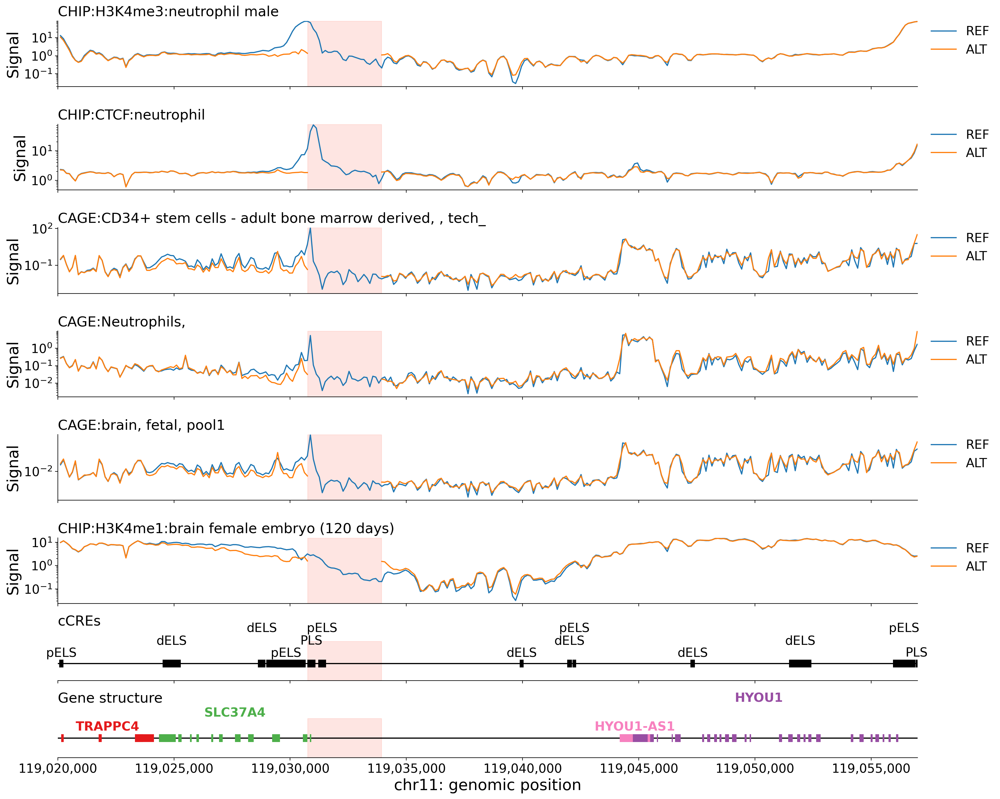

In [24]:
tracks_to_plot = [2778, 3881, 5141, 4767,  4981, 1739] # 4981, 3456, 3443 ,

plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=alt_remapped,
    ref_positions=ref_positions,
    alt_positions=ref_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=del_start,
    deletion_end=del_end,
    zoom_start=119020000,
    zoom_end=119057000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)


/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr11: genomic position'>],
       dtype=object))

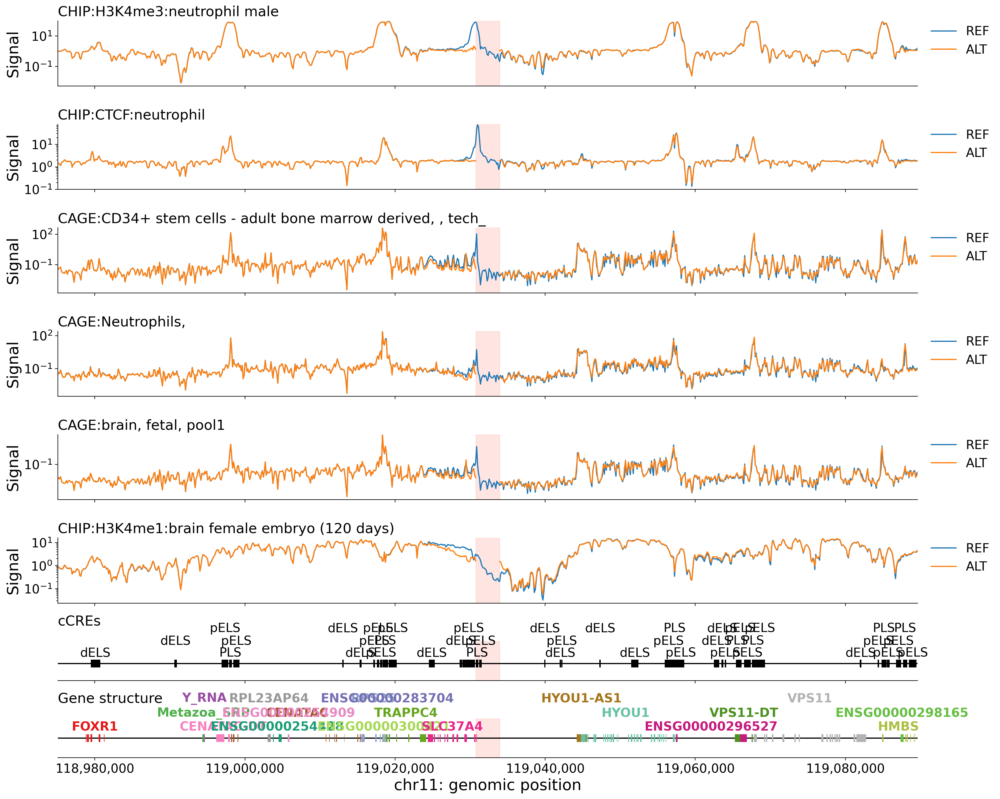

In [ ]:
# Full-window view (no zoom)
plot_ref_alt_tracks( # todo make them prettier... gene and ccres track crowded
    pred_ref=pred_ref,
    pred_alt=alt_remapped,
    ref_positions=ref_positions,
    alt_positions=ref_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=del_start,
    deletion_end=del_end,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)


## Example 2 — Tandem duplication: chr13:113,364,233

DRAGEN reports this as `SVTYPE=INS` with `DUPSVLEN=191`, `DUPSVINSLEN=2`,
`DUPSVINSSEQ=GC`: a 191 bp reference block gets duplicated in tandem, plus 2 novel
bases (`GC`) at the junction. Coordinate remap applied (see note above).

In [26]:
chrom = "chr13"
pos_1based = 113364233   # VCF POS
dup_len = 191             # DUPSVLEN
novel_seq = "GC"           # DUPSVINSSEQ
novel_len = 2              # DUPSVINSLEN
total_ins_len = dup_len + novel_len   # should equal SVLEN

pos_0based = pos_1based - 1


In [27]:
target_interval, ref_sequence = build_ref_window(chrom, pos_0based, fasta_extractor)

ins_point_idx = pos_0based - target_interval.start
duplicated_block = extract_upstream_duplicate(ref_sequence, ins_point_idx, dup_len)

alt_sequence, _ = apply_insertion(
    ref_sequence, target_interval, pos_1based, duplicated_block + novel_seq
)

pred_ref, pred_alt = predict_ref_alt(model, ref_sequence, alt_sequence)


In [28]:
ref_positions, bin_offsets = build_ref_positions(
    target_interval
)

alt_positions = remap_insertion_alt_positions(
    ref_positions,
    pos_0based,
    total_ins_len,
)

In [29]:
subset_effect_df(effect_df, df_targets)

,track,max_abs_effect,max_effect,max_effect_bin,max_effect_position,index,genome,identifier,file,clip,scale,sum_stat,description
1187,1187,98.538766,-98.538766,435,119030742.0,1187,0,ENCFF334AJI,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:HL-60
1218,1218,84.498847,-84.498847,435,119030742.0,1218,0,ENCFF493FQG,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:NB4
2778,2778,79.308852,-79.308852,435,119030742.0,2778,0,ENCFF891PZS,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:neutrophil male
3916,3916,78.007218,-78.007218,435,119030742.0,3916,0,ENCFF363RHA,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:CD14-positive monocyte male adult...
5217,5217,74.213169,-74.213169,641,119057110.0,5217,0,CNhs13224,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,"CAGE:CD14+CD16- Monocytes,"
1591,1591,72.312630,-72.312630,435,119030742.0,1591,0,ENCFF773MPY,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,"CHIP:H3K4me3:common myeloid progenitor, CD34-p..."
4766,4766,71.090261,-71.090261,641,119057110.0,4766,0,CNhs12003,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,"CAGE:Macrophage - monocyte derived,"
5215,5215,67.514964,-67.514964,641,119057110.0,5215,0,CNhs13208,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,"CAGE:CD14+CD16+ Monocytes,"
821,821,66.954876,-66.954876,435,119030742.0,821,0,ENCFF032QOM,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:CD14-positive monocyte female
5141,5141,66.481556,-66.481556,641,119057110.0,5141,0,CNhs12553,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,CAGE:CD34+ stem cells - adult bone marrow deri...


In [30]:
exon_df, ccres_df = load_annotations(
    "chr13_113167624-113560840.tsv",
    "chr13_113167624-113560840_ccres.tsv",
)


In [31]:
ccres_df = ccres_df[(~ ccres_df["cCRE_class"].str.startswith("CA"))  ]

/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr13: genomic position'>],
       dtype=object))

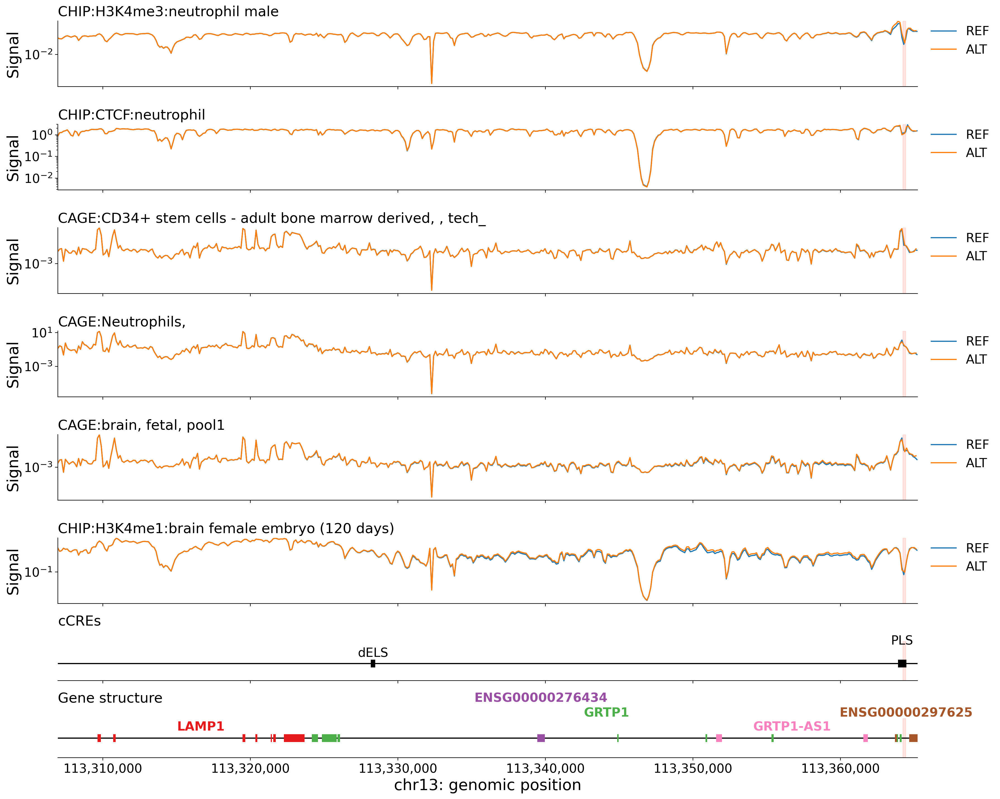

In [32]:
plot_ref_alt_tracks( #tracks_to_plot = [2778, 3881, 5141, 4767, 3335, 4694]
    pred_ref=pred_ref,
    pred_alt=pred_alt,
    ref_positions=ref_positions,
    alt_positions=alt_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=pos_1based,
    deletion_end=pos_1based + total_ins_len,
    zoom_start=ref_positions.min(),
    zoom_end=pos_1based + 1000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)


/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr13: genomic position'>],
       dtype=object))

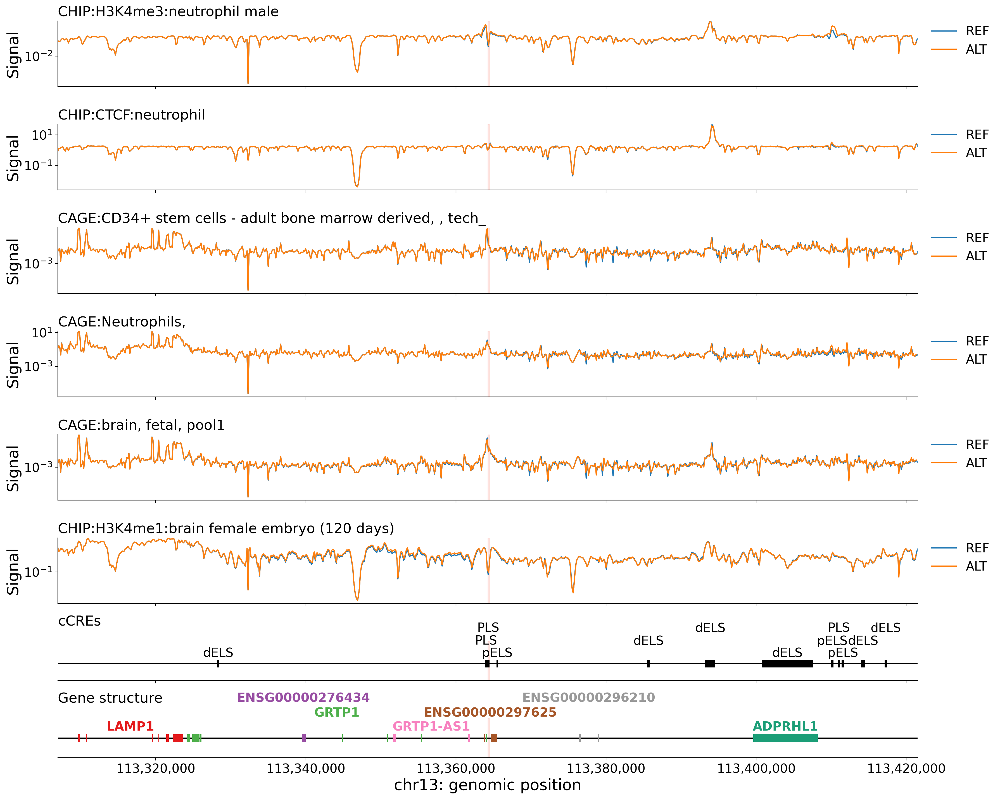

In [33]:
# Full-window view (no zoom)
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=pred_alt,
    ref_positions=ref_positions,
    alt_positions=alt_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=pos_1based,
    deletion_end=pos_1based + total_ins_len,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)


## Example 3 — Insertion: chr11:65,540,703

A 54 bp novel insertion (VCF `REF=C`, `ALT=C` + 54 novel bases). The VCF `ALT` string
includes the REF anchor base as its first character, so it's dropped before passing
to `apply_insertion`.

In [82]:
chrom = "chr11"
pos_1based = 65540703   # VCF POS

vcf_alt = "CGGGCGGGGCCTACAGGAGGGGCGGGGCCTACAGGAGGGGCGGGGCCTACAGGAG"
novel_seq = vcf_alt[1:]   # drop the shared REF anchor base
ins_len = len(novel_seq)   # should equal SVLEN

pos_0based = pos_1based - 1


In [83]:
target_interval, ref_sequence = build_ref_window(chrom, pos_0based, fasta_extractor)

alt_sequence, _ = apply_insertion(
    ref_sequence, target_interval, pos_1based, novel_seq
)

pred_ref, pred_alt = predict_ref_alt(model, ref_sequence, alt_sequence)


In [84]:
ref_positions, bin_offsets = build_ref_positions(
    target_interval
)

alt_positions = remap_insertion_alt_positions(
    ref_positions,
    pos_0based,
    ins_len,
)

In [37]:
subset_effect_df(effect_df, df_targets)

,track,max_abs_effect,max_effect,max_effect_bin,max_effect_position,index,genome,identifier,file,clip,scale,sum_stat,description
1187,1187,98.538766,-98.538766,435,119030742.0,1187,0,ENCFF334AJI,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:HL-60
1218,1218,84.498847,-84.498847,435,119030742.0,1218,0,ENCFF493FQG,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:NB4
2778,2778,79.308852,-79.308852,435,119030742.0,2778,0,ENCFF891PZS,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:neutrophil male
3916,3916,78.007218,-78.007218,435,119030742.0,3916,0,ENCFF363RHA,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:CD14-positive monocyte male adult...
5217,5217,74.213169,-74.213169,641,119057110.0,5217,0,CNhs13224,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,"CAGE:CD14+CD16- Monocytes,"
1591,1591,72.312630,-72.312630,435,119030742.0,1591,0,ENCFF773MPY,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,"CHIP:H3K4me3:common myeloid progenitor, CD34-p..."
4766,4766,71.090261,-71.090261,641,119057110.0,4766,0,CNhs12003,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,"CAGE:Macrophage - monocyte derived,"
5215,5215,67.514964,-67.514964,641,119057110.0,5215,0,CNhs13208,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,"CAGE:CD14+CD16+ Monocytes,"
821,821,66.954876,-66.954876,435,119030742.0,821,0,ENCFF032QOM,/home/drk/tillage/datasets/human/chip/encode/E...,32,2,mean,CHIP:H3K4me3:CD14-positive monocyte female
5141,5141,66.481556,-66.481556,641,119057110.0,5141,0,CNhs12553,/home/drk/tillage/datasets/human/cage/fantom/C...,384,1,sum,CAGE:CD34+ stem cells - adult bone marrow deri...


In [81]:
exon_df, ccres_df = load_annotations(
    "chr11_65344094_65737310.tsv",
    "chr11_65344094_65737310_ccres.tsv",
)


In [39]:
# subset to panel genes only
#panel_genes_df = pd.read_csv("unique_panel_genes.txt",sep="\t", header = None)
#panel_genes = panel_genes_df[0].tolist()
#exon_df = exon_df[exon_df["gene_name"].isin(panel_genes)]

In [40]:
#exon_df

,chr,start_pos,end_pos,gene_id,gene_name,pos_range
0,chr11,65344094,65344621,ENSG00000133884,DPF2,"[65343991, 65344622)"
1,chr11,65344580,65344621,ENSG00000133884,DPF2,"[65344580, 65344622)"
2,chr11,65345666,65345803,ENSG00000133884,DPF2,"[65345666, 65345804)"
3,chr11,65345666,65345803,ENSG00000133884,DPF2,"[65345666, 65345804)"
4,chr11,65345666,65345803,ENSG00000133884,DPF2,"[65345666, 65345804)"
...,...,...,...,...,...,...
1508,chr11,65719047,65719604,ENSG00000172977,KAT5,"[65719047, 65719605)"
1509,chr11,65719047,65719604,ENSG00000172977,KAT5,"[65719047, 65719605)"
1510,chr11,65719047,65719604,ENSG00000172977,KAT5,"[65719047, 65719605)"
1511,chr11,65719047,65719603,ENSG00000172977,KAT5,"[65719047, 65719604)"


In [41]:
exon_df.shape

(88, 6)

In [42]:
ref_positions.min(), ref_positions.max()

(np.float64(65483422.0), np.float64(65597982.0))

In [43]:
# get exons within range
#exon_zoom = exon_df[(exon_df["start_pos"] >= ref_positions.min()) & (exon_df["end_pos"] <= ref_positions.max())]
#exon_zoom

,chr,start_pos,end_pos,gene_id,gene_name,pos_range


/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr11: genomic position'>],
       dtype=object))

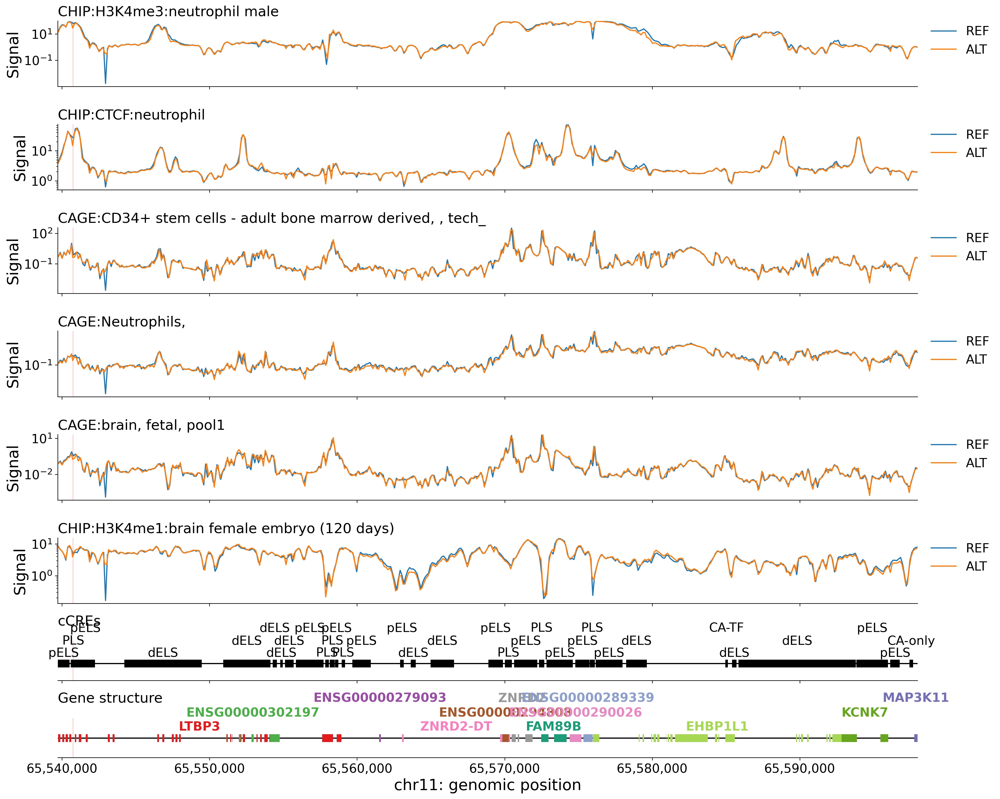

In [85]:
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=pred_alt,
    ref_positions=ref_positions,
    alt_positions=alt_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=pos_1based,
    deletion_end=pos_1based + ins_len,
    zoom_start=pos_1based - 1000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)


/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr11: genomic position'>],
       dtype=object))

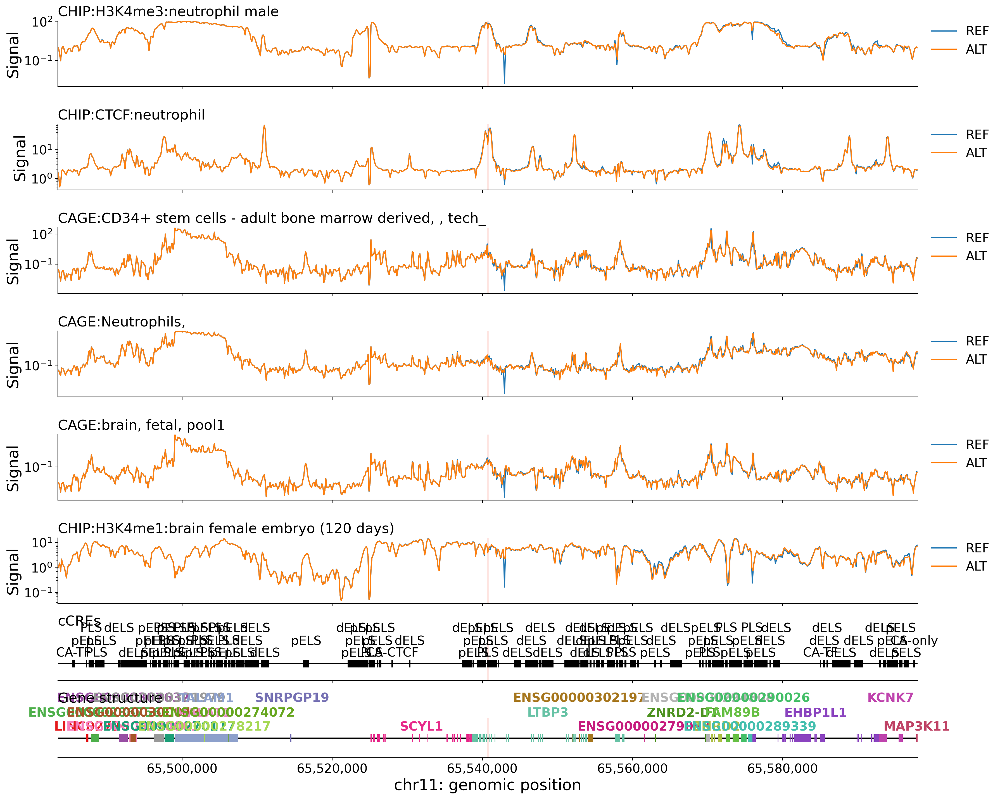

In [86]:
# Full-window view (no zoom)
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=pred_alt,
    ref_positions=ref_positions,
    alt_positions=alt_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=pos_1based,
    deletion_end=pos_1based + ins_len,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)


This is a very gene enriched region, however the variant does not imply large effects on regulatory or transcriptional activity.

## Example 4 - Deletion: chr1:32980462-32984252

In [46]:
chrom = "chr1"
del_start = 32980462
del_end = 32984252
del_len = del_end - del_start
variant_center = (del_start + del_end) // 2

In [47]:
target_interval, ref_sequence = build_ref_window(chrom, variant_center, fasta_extractor)

alt_sequence, del_start_idx, del_end_idx = apply_deletion(
    ref_sequence, target_interval, del_start, del_end, fasta_extractor, chrom
)
assert del_end_idx - del_start_idx == del_len

pred_ref, pred_alt = predict_ref_alt(model, ref_sequence, alt_sequence)

In [48]:
ref_positions, bin_offsets = build_ref_positions(target_interval)

alt_positions = remap_deletion_alt_positions(
    target_interval, del_start_idx, del_end_idx, bin_offsets
)


alt_remapped = remap_alt_to_ref_grid(
    alt_positions, pred_alt, ref_positions,
    del_start=del_start, del_end=del_end,
)
#effect_df = compute_effect_df(pred_ref, alt_remapped, ref_positions, df_targets)


In [49]:
exon_df, ccres_df = load_annotations(
    "chr1_32785749_33178965.tsv",
    "chr1_32785749_33178965_ccres.tsv",
)

In [50]:
ccres_df = ccres_df[(~ ccres_df["cCRE_class"].str.startswith("CA")) ] # & (~ ccres_df["cCRE_class"].str.startswith("pELS"))

/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr1: genomic position'>],
       dtype=object))

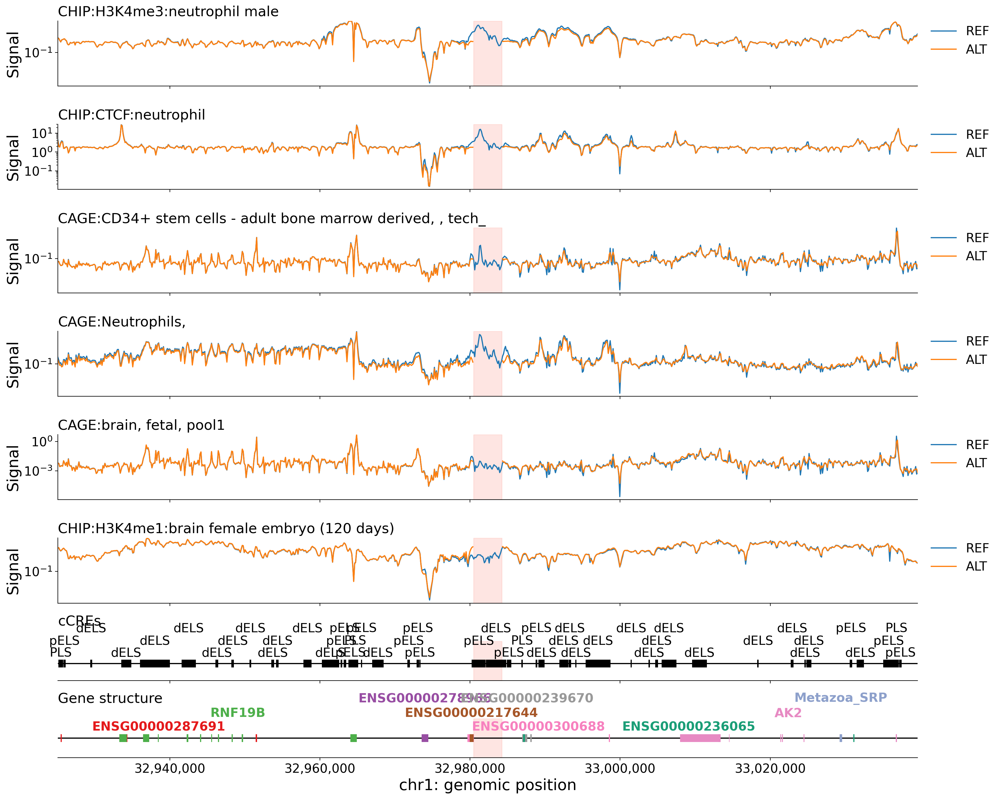

In [51]:
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=alt_remapped,
    ref_positions=ref_positions,
    alt_positions=ref_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=del_start,
    deletion_end=del_end,
    #zoom_start=119020000,
    #zoom_end=119057000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)

/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr1: genomic position'>],
       dtype=object))

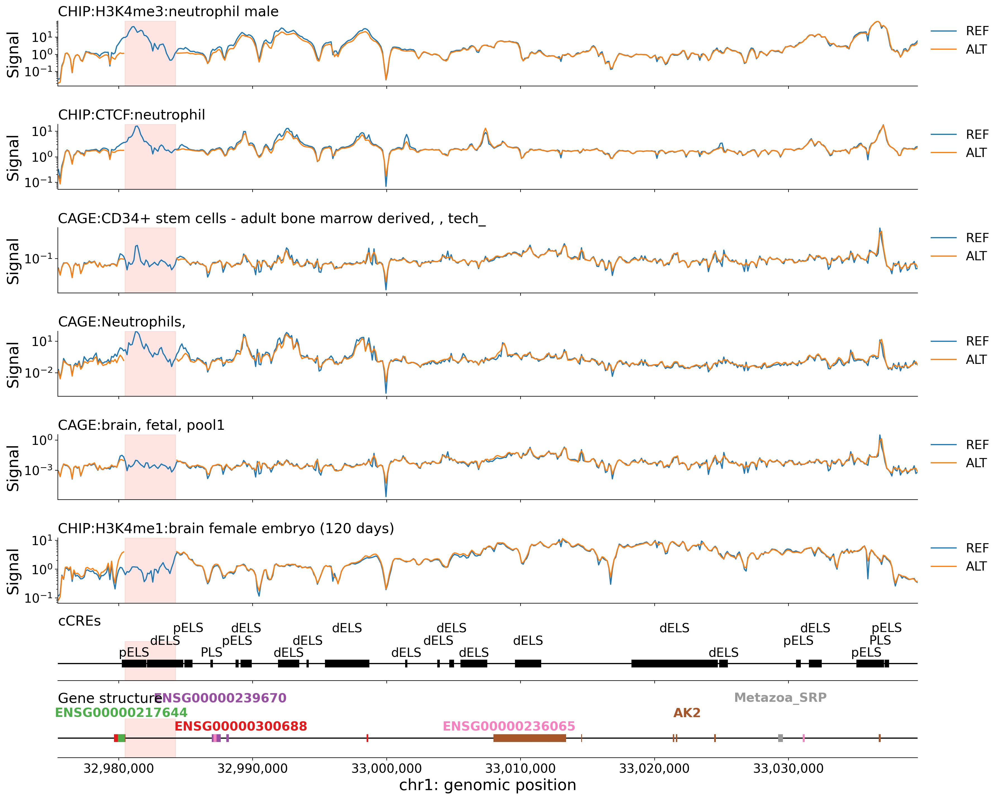

In [52]:
# Zoom-window view
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=alt_remapped,
    ref_positions=ref_positions,
    alt_positions=ref_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=del_start,
    deletion_end=del_end,
    zoom_start=del_start-5000,
    #zoom_end=119057000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)


deleted activity in both regional and transcriptional effect visible.
however, associated gene was AK2 which does not seem to be effected by the loss of its associated enhancer like regulatory elements.
Observed expression activity could not be linked to neutropenia.

### Example 5 - DEL: chr2:74576401-74576477

In [53]:
chrom = "chr2"
del_start = 74576401
del_end = 74576477
del_len = del_end - del_start
variant_center = (del_start + del_end) // 2

In [54]:
target_interval, ref_sequence = build_ref_window(chrom, variant_center, fasta_extractor)

alt_sequence, del_start_idx, del_end_idx = apply_deletion(
    ref_sequence, target_interval, del_start, del_end, fasta_extractor, chrom
)
assert del_end_idx - del_start_idx == del_len

pred_ref, pred_alt = predict_ref_alt(model, ref_sequence, alt_sequence)

In [55]:
ref_positions, bin_offsets = build_ref_positions(target_interval)

alt_positions = remap_deletion_alt_positions(
    target_interval, del_start_idx, del_end_idx, bin_offsets
)

alt_remapped = remap_alt_to_ref_grid(
    alt_positions, pred_alt, ref_positions,
    del_start=del_start, del_end=del_end,
)

#effect_df = compute_effect_df(pred_ref, alt_remapped, ref_positions, df_targets)


In [56]:
exon_df, ccres_df = load_annotations(
    "chr2_74379831-74773047.tsv",
    "chr2_74379831-74773047_ccres.tsv",
)

In [57]:
ccres_df = ccres_df[(~ ccres_df["cCRE_class"].str.startswith("CA")) ] # & (~ ccres_df["cCRE_class"].str.startswith("pELS"))


/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me3:testis male adult (37 years)'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:testis, adult, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr2: genomic position'>],
       dtype=object))

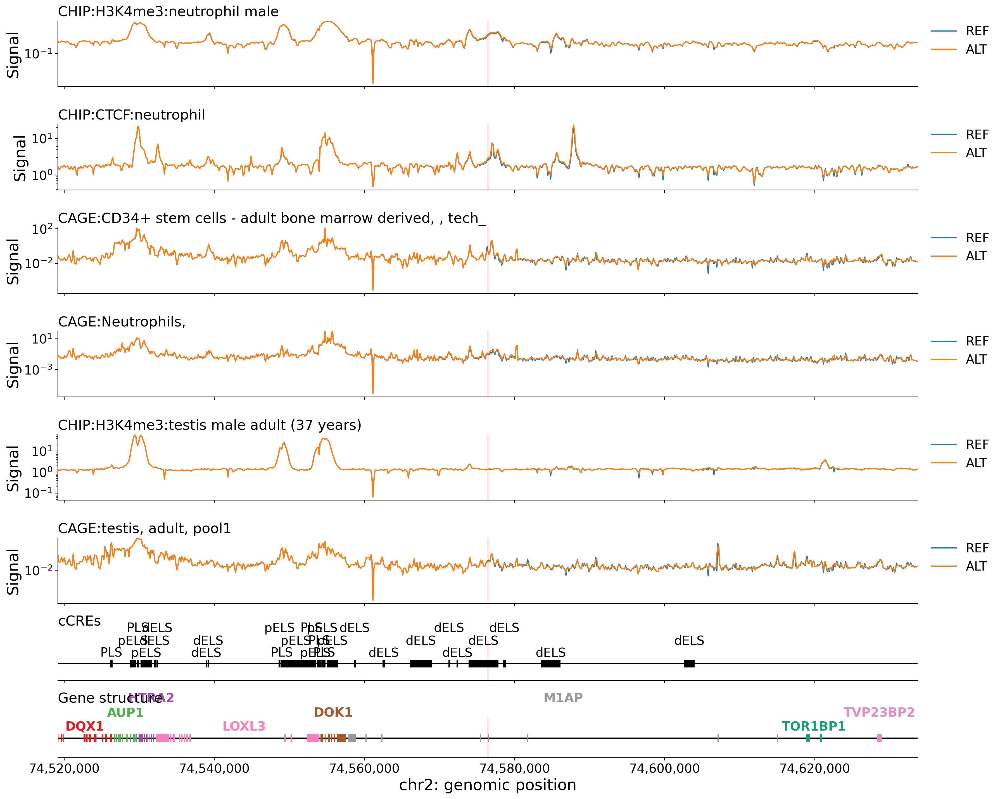

In [58]:
tracks_to_plot_testis = [2778, 3881, 5141, 4767, 3335, 4694]
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=alt_remapped,
    ref_positions=ref_positions,
    alt_positions=ref_positions,
    tracks_to_plot=tracks_to_plot_testis,
    target_interval=target_interval,
    deletion_start=del_start,
    deletion_end=del_end,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)

No effects on associated gene HTRA2. Affects M1AP which is involved in spermatogenesis, however, no effect visible in testis cells

/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me3:testis male adult (37 years)'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:testis, adult, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr2: genomic position'>],
       dtype=object))

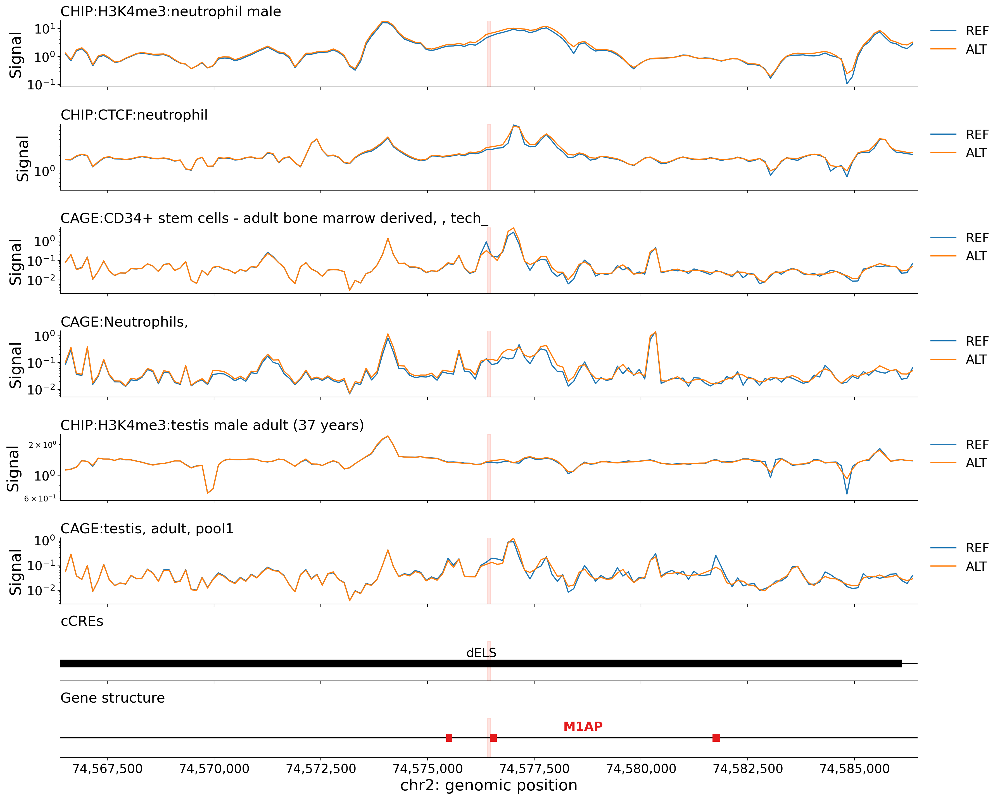

In [59]:
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=alt_remapped,
    ref_positions=ref_positions,
    alt_positions=ref_positions,
    tracks_to_plot=tracks_to_plot_testis,
    target_interval=target_interval,
    deletion_start=del_start,
    deletion_end=del_end,
    zoom_start=del_start-10000,
    zoom_end=del_end+10000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)

## Example 5 - Insertion: chr1:172659345

In [60]:
chrom = "chr1"
pos_1based = 172659345   # VCF POS

vcf_alt = "ACCGCCACCGCCACCACTACCACCTCCGCCGCCGCCGCCACCACTACCACCTCCG"
novel_seq = vcf_alt[1:]   # drop the shared REF anchor base
ins_len = len(novel_seq)   # should equal SVLEN
pos_0based = pos_1based - 1

In [61]:
target_interval, ref_sequence = build_ref_window(chrom, pos_0based, fasta_extractor)

alt_sequence, _ = apply_insertion(
    ref_sequence, target_interval, pos_1based, novel_seq
)

pred_ref, pred_alt = predict_ref_alt(model, ref_sequence, alt_sequence)


In [62]:
exon_df, ccres_df = load_annotations(
    "chr1_172462737-172855953.tsv",
    "chr1_172462737-172855953_ccres.tsv",
)

In [63]:
ccres_df = ccres_df[(~ ccres_df["cCRE_class"].str.startswith("CA")) ]


In [64]:
ref_positions, bin_offsets = build_ref_positions(
    target_interval
)

alt_positions = remap_insertion_alt_positions(
    ref_positions,
    pos_0based,
    ins_len,
)

/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr1: genomic position'>],
       dtype=object))

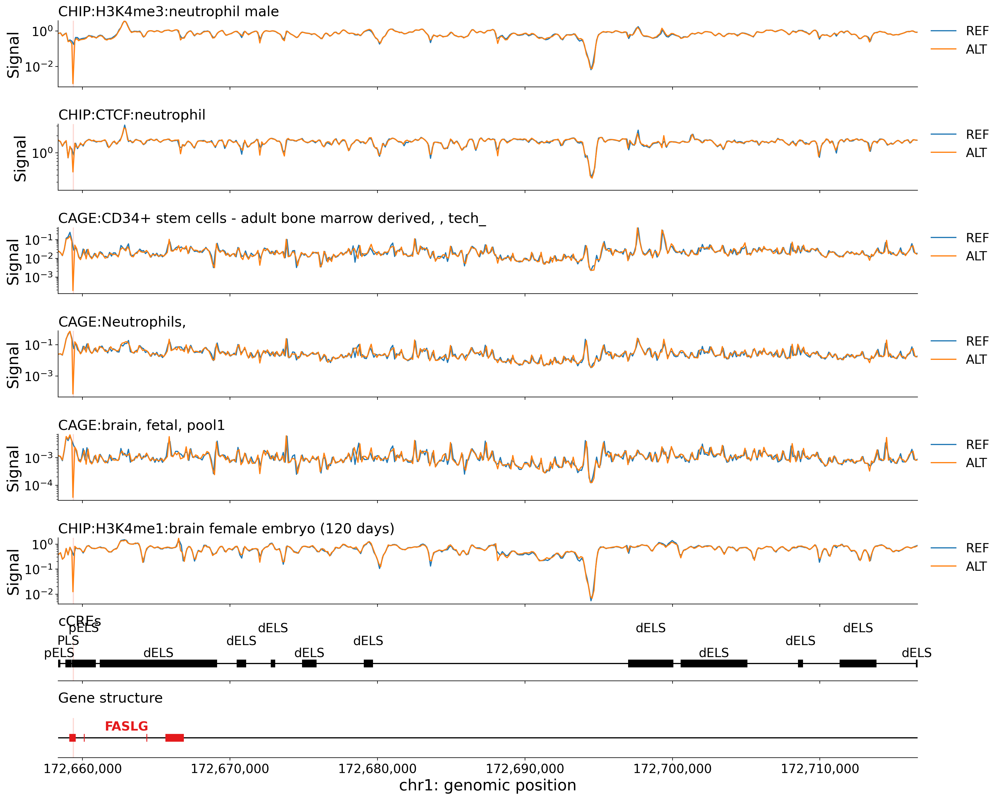

In [65]:
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=pred_alt,
    ref_positions=ref_positions,
    alt_positions=alt_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=pos_1based,
    deletion_end=pos_1based + ins_len,
    zoom_start=pos_1based - 1000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)


/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr1: genomic position'>],
       dtype=object))

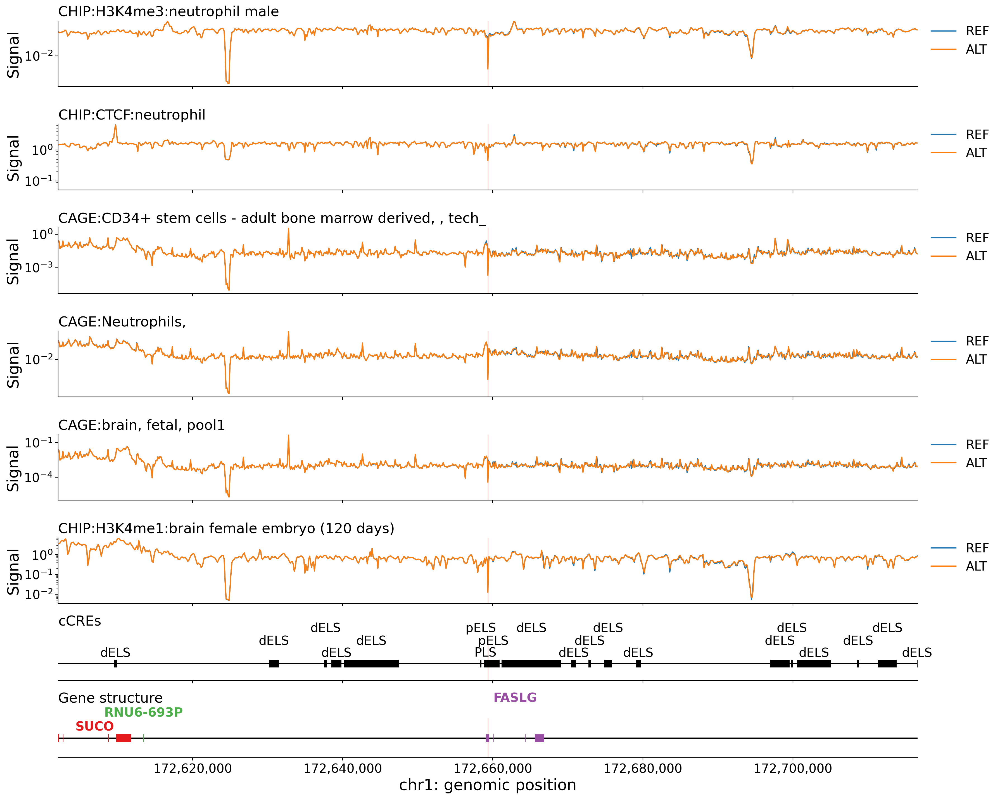

In [66]:
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=pred_alt,
    ref_positions=ref_positions,
    alt_positions=alt_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=pos_1based,
    deletion_end=pos_1based + ins_len,
    #zoom_start=pos_1based - 1000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)

No effect on FASLG.

## Example 6 - Deletion: chr19:10811855-10817361

In [87]:
chrom = "chr19"
del_start = 10811855
del_end = 10817361
del_len = del_end - del_start
variant_center = (del_start + del_end) // 2

target_interval, ref_sequence = build_ref_window(chrom, variant_center, fasta_extractor)

alt_sequence, del_start_idx, del_end_idx = apply_deletion(
    ref_sequence, target_interval, del_start, del_end, fasta_extractor, chrom
)
assert del_end_idx - del_start_idx == del_len

pred_ref, pred_alt = predict_ref_alt(model, ref_sequence, alt_sequence)

ref_positions, bin_offsets = build_ref_positions(target_interval)

alt_positions = remap_deletion_alt_positions(
    target_interval, del_start_idx, del_end_idx, bin_offsets
)


alt_remapped = remap_alt_to_ref_grid(
    alt_positions, pred_alt, ref_positions,
    del_start=del_start, del_end=del_end,
)

#effect_df = compute_effect_df(pred_ref, alt_remapped, ref_positions, df_targets)


In [88]:
exon_df, ccres_df = load_annotations(
    "chr19_10618000-11011216.tsv",
    "chr19_10618000-11011216_ccres.tsv",
)

In [69]:
ccres_df = ccres_df[(~ ccres_df["cCRE_class"].str.startswith("CA"))  ] #

In [91]:
tracks_to_plot

[2778, 3881, 5141, 4767, 4981, 1739]

In [94]:
top_effects[top_effects["track"].isin(tracks_to_plot)]

,track,max_abs_effect,max_effect,max_effect_bin,max_effect_position,index,genome,identifier,file,clip,scale,sum_stat,description


In [96]:
effect_df = compute_effect_df(pred_ref, alt_remapped, ref_positions, df_targets)

# See what actually moves for this variant
#top_effects = effect_df.sort_values("max_abs_effect", ascending=False)
effect_df[effect_df["track"].isin(tracks_to_plot)][["track", "description", "max_abs_effect", "max_effect_position"]]

,track,description,max_abs_effect,max_effect_position
1739,1739,CHIP:H3K4me1:brain female embryo (120 days),1.282441,10833104.0
2778,2778,CHIP:H3K4me3:neutrophil male,6.677362,10848464.0
3881,3881,CHIP:CTCF:neutrophil,8.508414,10820432.0
4767,4767,"CAGE:Neutrophils,",34.003145,10848336.0
4981,4981,"CAGE:brain, fetal, pool1",0.254818,10836304.0
5141,5141,CAGE:CD34+ stem cells - adult bone marrow deri...,13.459605,10836176.0


/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr19: genomic position'>],
       dtype=object))

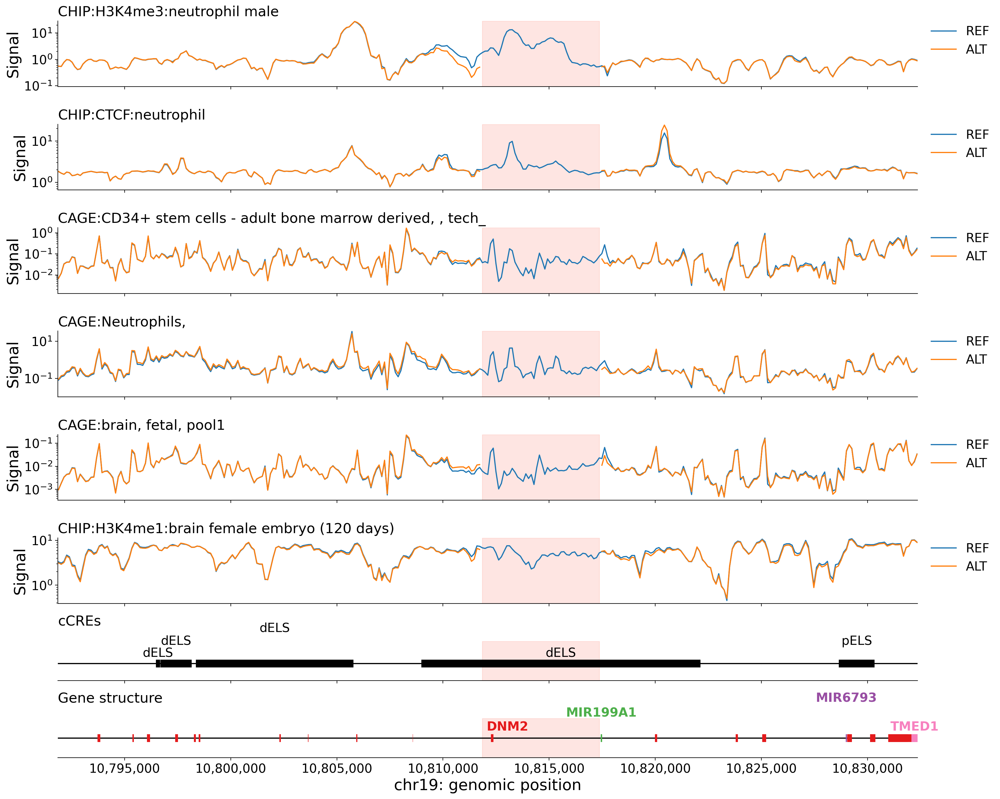

In [70]:
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=alt_remapped,
    ref_positions=ref_positions,
    alt_positions=ref_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=del_start,
    deletion_end=del_end,
    zoom_start=del_start - 20000,
    zoom_end=del_end + 15000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)

/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr19: genomic position'>],
       dtype=object))

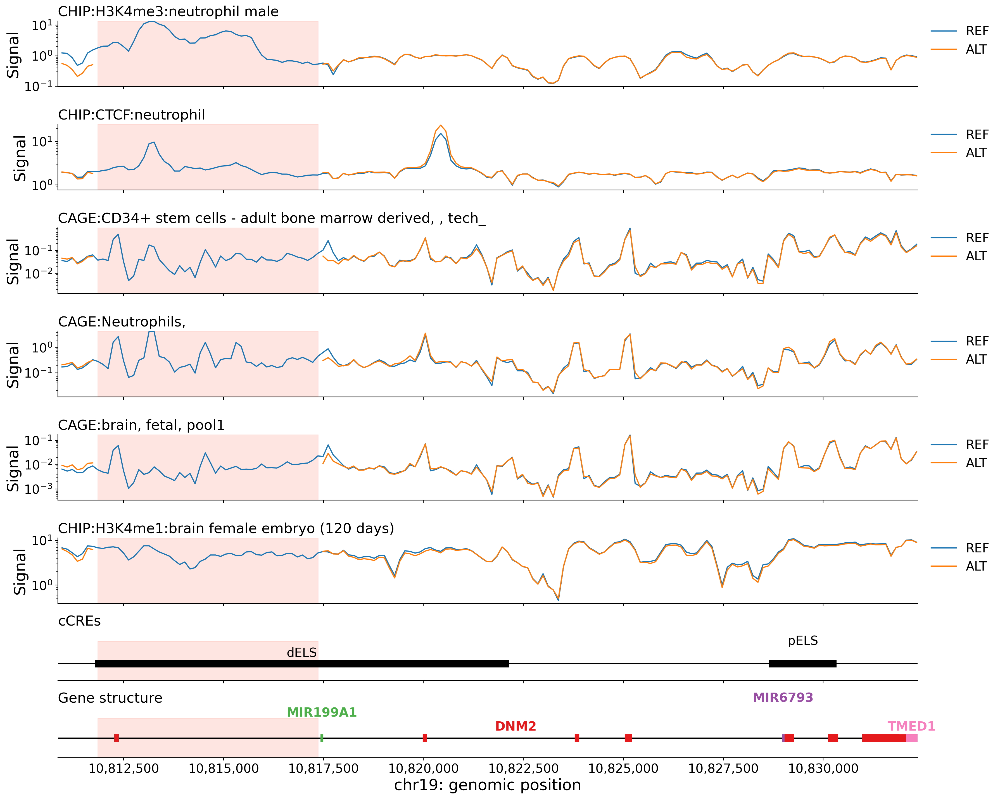

In [71]:
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=alt_remapped,
    ref_positions=ref_positions,
    alt_positions=ref_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=del_start,
    deletion_end=del_end,
    zoom_start=del_start - 1000,
    zoom_end=del_end + 15000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)

/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr19: genomic position'>],
       dtype=object))

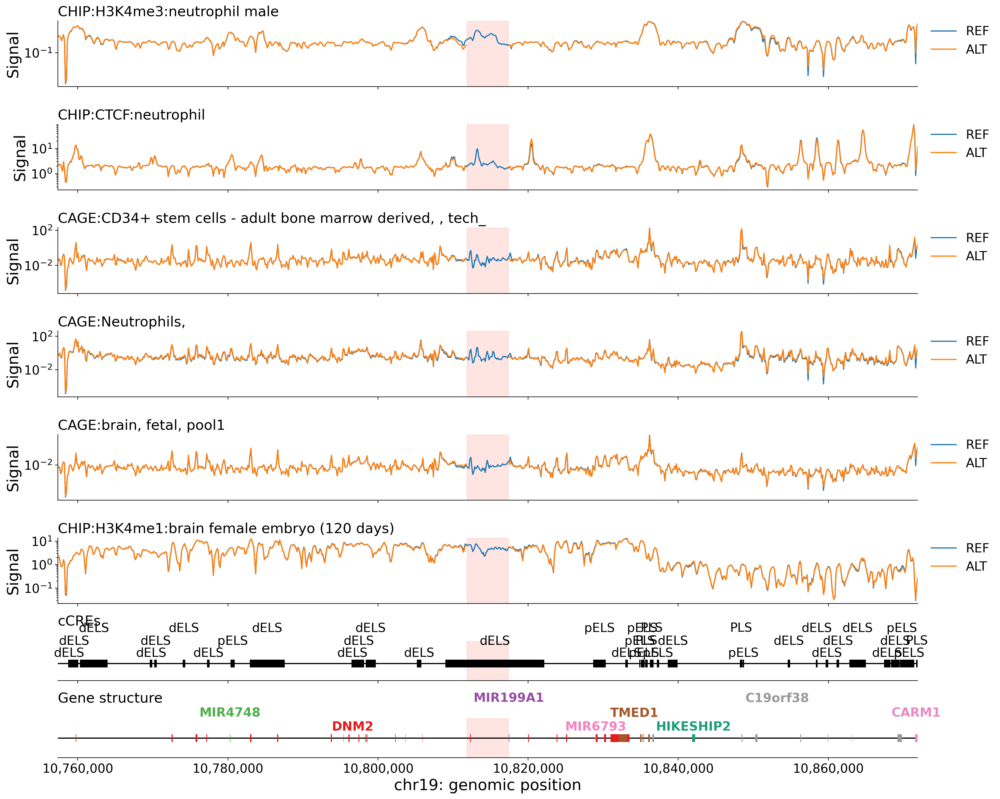

In [72]:
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=alt_remapped,
    ref_positions=ref_positions,
    alt_positions=ref_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=del_start,
    deletion_end=del_end,
    #zoom_start=119020000,
    #zoom_end=119057000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)


/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr19: genomic position'>],
       dtype=object))

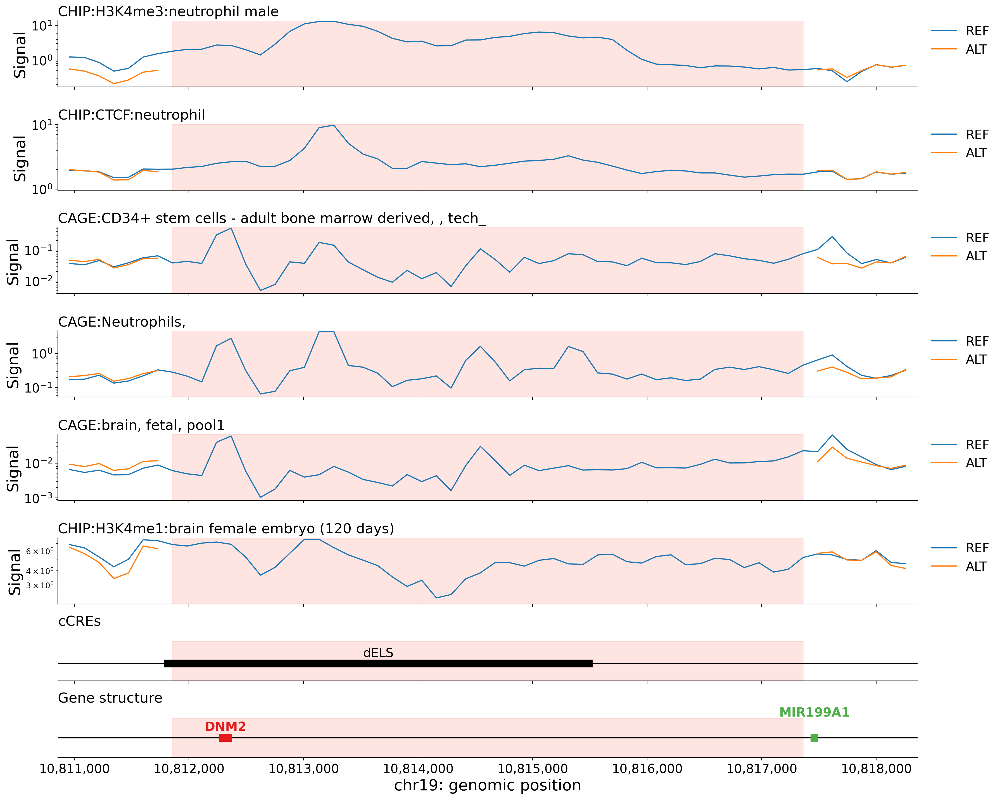

In [73]:
plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=alt_remapped,
    ref_positions=ref_positions,
    alt_positions=ref_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=del_start,
    deletion_end=del_end,
    zoom_start=del_start - 1000,
    zoom_end=del_end + 1000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)

Evaluation see Report

## Example 7 - Insertion: chr22:50547870

This variant was found as the one of the top ranked pELS, which is associated with the inhouse panel gene 'SCO2'.

In [74]:
chrom = "chr22"
pos_1based = 50547870   # VCF POS

vcf_alt = "CCAGTCCCAACCCCAGCCCTAAGCCCAGCTCCAACTCCAGCCCCAACCCCAGCCGCATCCCCAGCCCTAACCCCAGTCCCAACCCCAGCCCTAAGCCCAGCTCCAACTCCAGCCCTAACCCCAGCCGCATCCCCAGCCCTAACCCCAGTCCCAACCCCAGCCCTAAGCCC"
novel_seq = vcf_alt[1:]   # drop the shared REF anchor base
ins_len = len(novel_seq)   # should equal SVLEN
pos_0based = pos_1based - 1

target_interval, ref_sequence = build_ref_window(chrom, pos_0based, fasta_extractor)

alt_sequence, _ = apply_insertion(
    ref_sequence, target_interval, pos_1based, novel_seq
)

pred_ref, pred_alt = predict_ref_alt(model, ref_sequence, alt_sequence)


ref_positions, bin_offsets = build_ref_positions(
    target_interval
)

alt_positions = remap_insertion_alt_positions(
    ref_positions,
    pos_0based,
    ins_len,
)


In [75]:
exon_df, ccres_df = load_annotations(
    "chr22_50351261-50744477.tsv",
    "chr22_50351261-50744477_ccres.tsv",
)

In [76]:
ccres_df = ccres_df[(~ ccres_df["cCRE_class"].str.startswith("CA"))  ]

In [77]:
exon_df

,chr,start_pos,end_pos,gene_id,gene_name,pos_range
0,chr22,50372020,50372150,ENSG00000100239,PPP6R2,"[50372020, 50372151)"
1,chr22,50372020,50372150,ENSG00000100239,PPP6R2,"[50372020, 50372151)"
2,chr22,50372020,50372150,ENSG00000100239,PPP6R2,"[50372020, 50372151)"
3,chr22,50372020,50372150,ENSG00000100239,PPP6R2,"[50372020, 50372151)"
4,chr22,50372020,50372150,ENSG00000100239,PPP6R2,"[50372020, 50372151)"
...,...,...,...,...,...,...
2361,chr22,50739271,50739474,ENSG00000100312,ACR,"[50739271, 50739475)"
2362,chr22,50739694,50739977,ENSG00000100312,ACR,"[50739694, 50739978)"
2363,chr22,50740593,50740840,ENSG00000254499,ENSG00000254499,"[50740593, 50740841)"
2364,chr22,50743485,50743520,ENSG00000254499,ENSG00000254499,"[50743485, 50743521)"


In [ ]:
exon_df = exon_df[exon_df["gene_name"].isin(["SCO2"]) ] # since this region is highly enriched with genes pick the to relevant genes to observe

/tmp/ipykernel_904/3428338113.py:138: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(


(<Figure size 1800x1440 with 8 Axes>,
 array([<Axes: title={'left': 'CHIP:H3K4me3:neutrophil male'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:CTCF:neutrophil'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:CD34+ stem cells - adult bone marrow derived, , tech_'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:Neutrophils,'}, ylabel='Signal'>,
        <Axes: title={'left': 'CAGE:brain, fetal, pool1'}, ylabel='Signal'>,
        <Axes: title={'left': 'CHIP:H3K4me1:brain female embryo (120 days)'}, ylabel='Signal'>,
        <Axes: title={'left': 'cCREs'}>,
        <Axes: title={'left': 'Gene structure'}, xlabel='chr22: genomic position'>],
       dtype=object))

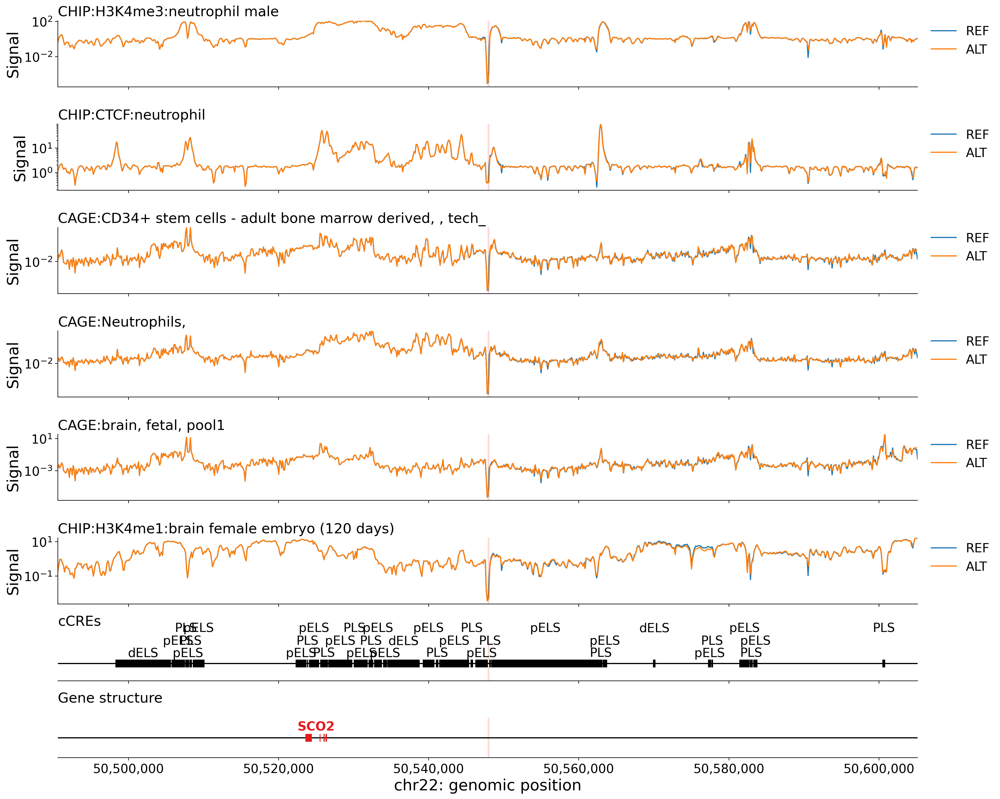

In [80]:

plot_ref_alt_tracks(
    pred_ref=pred_ref,
    pred_alt=pred_alt,
    ref_positions=ref_positions,
    alt_positions=alt_positions,
    tracks_to_plot=tracks_to_plot,
    target_interval=target_interval,
    deletion_start=pos_1based,
    deletion_end=pos_1based + ins_len,
    #zoom_start=pos_1based - 1000,
    df_targets=df_targets,
    exon_df=exon_df,
    ccre_df=ccres_df,
    height=1.8,
)

no observable effect on this gene